# Recarga del dataset final --> ready_df

In [ ]:
# Montamos el drive

from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Importamos el archivo ready_df que es el resultado del Preprocesamiento y del Análisis de Sentimientos previo.

import pandas as pd

try:
    ready_df = pd.read_excel('/content/drive/MyDrive/CAPSTONE/preprocessing_wip_Maite/ready_df.xlsx', index_col=None)

    # Verificar si ready_df es un DataFrame
    # if isinstance(ready_df, pd.DataFrame):
    #     print("ready_df es un DataFrame")
    # else:
    #     print("ready_df NO es un DataFrame")

except ValueError as e:
    print(f'Error de formato del archivo Excel: {e}')
except FileNotFoundError as e:
    print(f'Error al encontrar el archivo: {e}')
except pd.errors.ParserError as e:
    print(f'Error al analizar el archivo Excel: {e}')
except Exception as e:
    print(f'Error desconocido: {e}')

In [ ]:
# Quitamos el personaje Escena, ya que no queremos analizarlo.

ready_df = ready_df[ready_df['Personaje'] != 'scene']

In [ ]:
# Hacemos un chequeo de los tipos de datos que tenemos en el archivo. Los algoritmos de clustering sólo aceptan variables numéricas, por lo que debemos asegurarnos de seleccionar este tipo de variables y dejar fuera al resto.

ready_df.dtypes

,0
Temporada,int64
Episodio,int64
Titulo,object
Personaje,object
Texto,object
Personaje_id,int64
Palabras_clave,object
textblob_sentiment,float64
textblob_custom_sentiment,float64
Vader_sentimiento,object


## CORRELATION MATRIX - HEATMAP

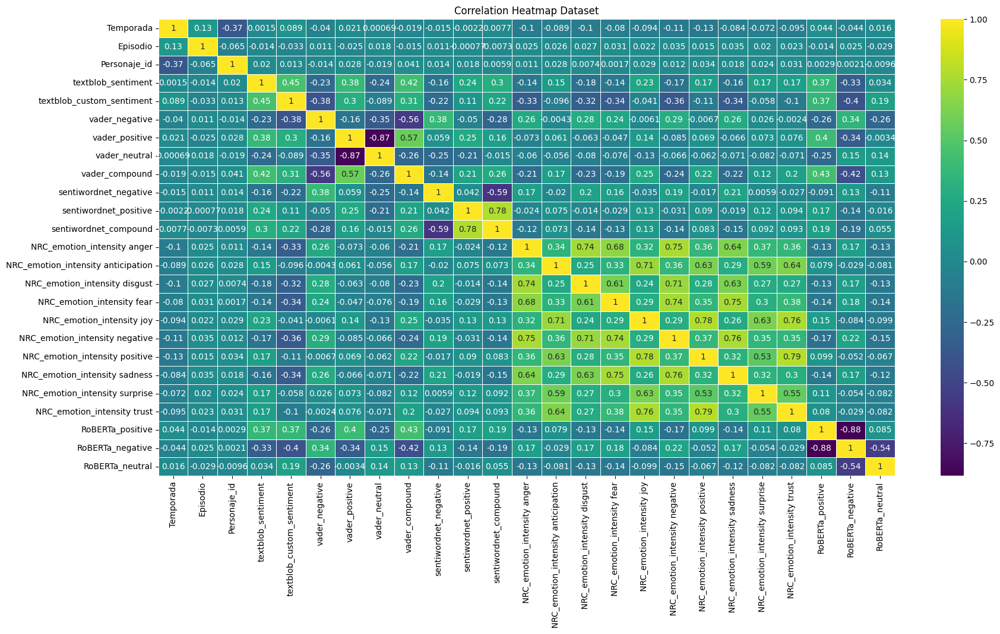

In [ ]:
# Realizamos una matriz de correlaciones para tener una idea de qué variables pueden estar relacionadas entre sí.

import seaborn as sns
import matplotlib.pyplot as plt

correlation_matrix = ready_df.corr(numeric_only=True)

plt.figure(figsize=(20, 10))

sns.heatmap(correlation_matrix, annot=True, linewidths=.5, cmap='viridis')
plt.title("Correlation Heatmap Dataset")
plt.show()

# <font color='red'>MACHINE LEARNING NO SUPERVISADO</font>

In [ ]:
# Dropeo las variables categóricas

X = ready_df.dtypes[ready_df.dtypes != 'object'].index
X = ready_df[X]

X.head(2)

,Temporada,Episodio,Personaje_id,textblob_sentiment,textblob_custom_sentiment,vader_negative,vader_positive,vader_neutral,vader_compound,sentiwordnet_negative,...,NRC_emotion_intensity fear,NRC_emotion_intensity joy,NRC_emotion_intensity negative,NRC_emotion_intensity positive,NRC_emotion_intensity sadness,NRC_emotion_intensity surprise,NRC_emotion_intensity trust,RoBERTa_positive,RoBERTa_negative,RoBERTa_neutral
0,1,1,9,0.128788,-0.4,0.03,0.119,0.851,0.8867,0.039474,...,0,2,2,3,1,1,2,0.250465,0.356381,0.393154
2,1,1,0,0.000000,0.0,0.00,0.000,1.000,0.0000,0.000000,...,0,0,0,0,0,0,0,0.165801,0.456294,0.377905


### StandardScaler (escala todo)

In [ ]:
X.shape

(15422, 25)


### StandardScaler (escala todo lo numérico menos temporada, episodio y personaje_id)

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Suponiendo que ya has definido y escalado tu DataFrame X como se mostró anteriormente

# Paso 1: Almacenar las columnas que no se escalaron
# non_scaled_columns = X[['Temporada', 'Episodio', 'Personaje_id']]

# Paso 2: Escalar las columnas numéricas y transformar X
# Definir las columnas a escalar
columns_to_scale = X.select_dtypes(include=['int64', 'float64']).columns.tolist()
columns_to_exclude = ['Temporada', 'Episodio', 'Personaje_id']

# Filtrar las columnas a escalar
columns_to_scale = [col for col in columns_to_scale if col not in columns_to_exclude]

# Crear el pipeline para la escalación
pip = Pipeline(
    steps=[('sc', StandardScaler())]
)

# Crear el ColumnTransformer
pre = ColumnTransformer(
    transformers=[
        ('sc', pip, columns_to_scale)  # Solo escalar las columnas seleccionadas
    ],
    remainder='passthrough',  # Dejar las demás columnas sin cambios
    verbose_feature_names_out=False,
    sparse_threshold=0
)

# Configurar la salida para que sea un DataFrame de pandas
pre.set_output(transform='pandas')

# Aplicar la transformación
X = pre.fit_transform(X)

X.head(2)

,textblob_sentiment,textblob_custom_sentiment,vader_negative,vader_positive,vader_neutral,vader_compound,sentiwordnet_negative,sentiwordnet_positive,sentiwordnet_compound,NRC_emotion_intensity anger,...,NRC_emotion_intensity trust,RoBERTa_positive,RoBERTa_negative,RoBERTa_neutral,Temporada,Episodio,Personaje_id,k_means,Personaje,highlight
0,0.294791,-0.554050,-0.180957,-0.118162,0.203223,2.406718,-0.045781,0.070399,0.085448,-0.351219,...,2.558772,-0.110398,-0.445724,1.150120,1,1,9,3,walter,True
2,-0.239147,0.565786,-0.403959,-0.589298,0.762002,-0.237633,-0.478618,-0.604361,-0.186303,-0.351219,...,-0.418097,-0.417529,-0.139658,1.050439,1,1,0,0,NaN,False


# <font color="red">K-MEANS</font>

## K-Means Clustering with all the numeric variables

**Centroid-based clustering:** Partitions the data into a predefined number of clusters (k) by minimizing the variance (inertia) within each cluster.

*   Assigns each data point to the nearest cluster centroid and iteratively updates centroids based on the mean of points in each cluster.
*   Relies on distances (usually Euclidean distance) to assign points to clusters.
*   You must specify the number of clusters (k) in advance.
*   Not suitable if you don't know the optimal number of clusters beforehand.
*   Assumes that clusters are spherical and equally sized because it assigns points based on distance to the centroid.
*   Struggles with clusters that have irregular shapes, especially in cases where the clusters overlap or are elongated.

In [ ]:
# Verificar el tipo de dato de las columnas que conservamos

X.dtypes

,0
textblob_sentiment,float64
textblob_custom_sentiment,float64
vader_negative,float64
vader_positive,float64
vader_neutral,float64
vader_compound,float64
sentiwordnet_negative,float64
sentiwordnet_positive,float64
sentiwordnet_compound,float64
NRC_emotion_intensity anger,float64


In [ ]:
# Separate continous variables from discrete ones

continous_variables = X.select_dtypes(include=['float64'])
discrete_variables = X.select_dtypes(include=['int64'])

In [ ]:
# Chequear que no haya valores nulos

continous_variables.isnull().sum()

,0
textblob_sentiment,0
textblob_custom_sentiment,0
vader_negative,0
vader_positive,0
vader_neutral,0
vader_compound,0
sentiwordnet_negative,0
sentiwordnet_positive,0
sentiwordnet_compound,0
NRC_emotion_intensity anger,0


### The Elbow Method

In [ ]:
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import KMeans

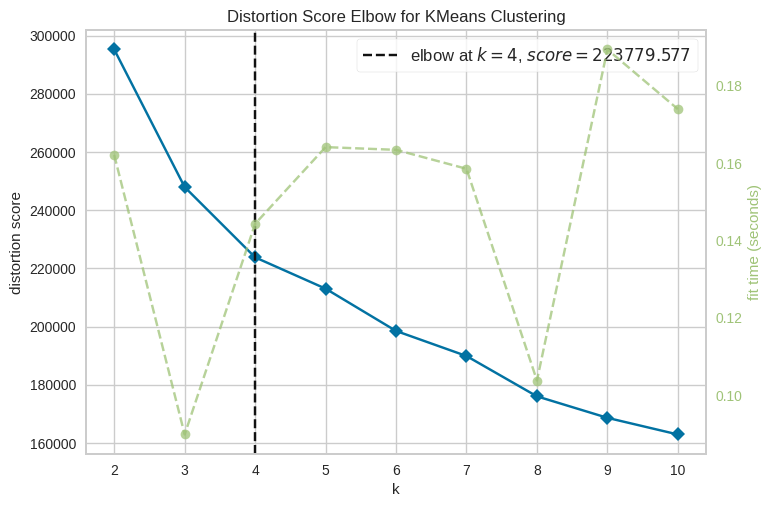

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
km = KMeans(init = 'k-means++', n_init='auto', random_state=0)
visualizer = KElbowVisualizer(km, k=(2, 11))
visualizer.fit(continous_variables)
visualizer.show()

### Aplicación del algoritmo K-Means

In [ ]:
from sklearn.cluster import KMeans

kmeans_data = KMeans(n_clusters=4, init='k-means++', n_init='auto', random_state=0)
kmeans_data_y = kmeans_data.fit_predict(continous_variables)

pd.Series(kmeans_data_y).value_counts()

# Add cluster labels to the original DataFrame
X['k_means'] = kmeans_data.labels_

X = pd.concat([X, ready_df[['Personaje']]], axis=1)

# Check the first few rows to confirm
X.head()

   textblob_sentiment  textblob_custom_sentiment  vader_negative  \
0            0.294791                  -0.554050       -0.180957   
2           -0.239147                   0.565786       -0.403959   
3            3.077554                   2.805458       -0.403959   
4           -0.239147                   0.565786       -0.403959   
5           -0.239147                  -0.554050       -0.403959   

   vader_positive  vader_neutral  vader_compound  sentiwordnet_negative  \
0       -0.118162       0.203223        2.406718              -0.045781   
2       -0.589298       0.762002       -0.237633              -0.478618   
3        2.526537      -2.189400        1.467909              -0.478618   
4       -0.589298       0.762002       -0.237633              -0.478618   
5       -0.589298       0.762002       -0.237633               0.320927   

   sentiwordnet_positive  sentiwordnet_compound  NRC_emotion_intensity anger  \
0               0.070399               0.085448             

## Plotting: TEXTBLOB

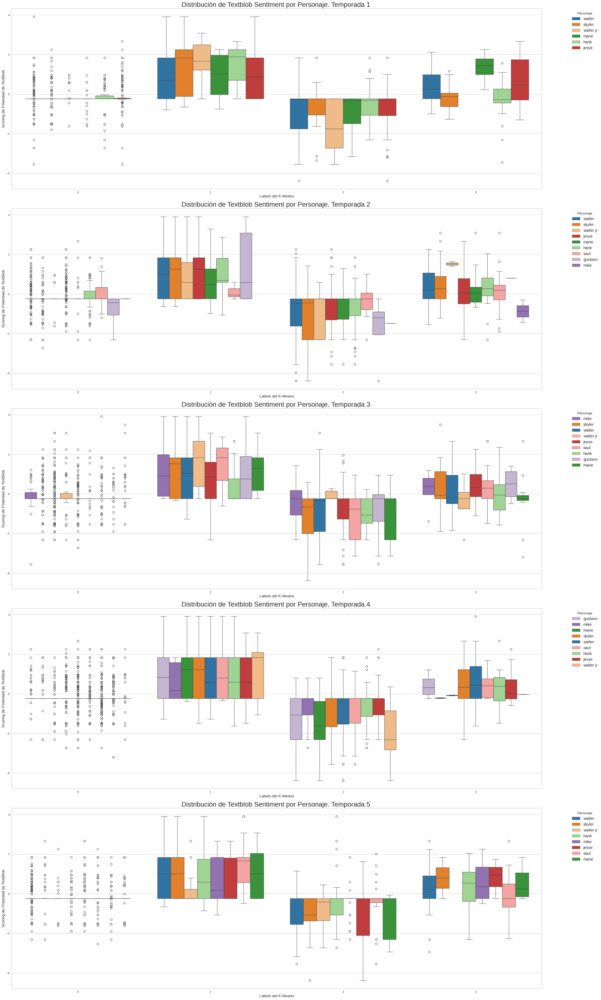

In [ ]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

# Ignore all warnings
warnings.filterwarnings("ignore")

# Get unique values of Temporada
temporadas = X['Temporada'].unique()

# Get unique Personajes and create a color palette
personajes = X['Personaje'].unique()
palette = sns.color_palette("tab20", len(personajes))  # Use a color palette with enough colors for each Personaje
color_dict = dict(zip(personajes, palette))  # Create a mapping of Personaje to color

# Set up the figure for multiple plots
plt.figure(figsize=(30, 10 * len(temporadas)))  # Adjust height based on the number of Temporadas

# Iterate over each Temporada and create a box plot
for i, temporada in enumerate(temporadas):
    plt.subplot(len(temporadas), 1, i + 1)  # Create a subplot for each Temporada

    # Box plot for the current Temporada
    sns.boxplot(
        x='k_means',
        y='textblob_sentiment',
        hue='Personaje',
        data=X[X['Temporada'] == temporada],
        palette=color_dict  # Use the defined color dictionary
    )

    # Adjust title and labels for each subplot
    plt.title(f'Distribución de Textblob Sentiment por Personaje. Temporada {temporada} ', fontsize=24)
    plt.xlabel('Labels del K-Means', fontsize=14)
    plt.ylabel('Scoring de Polaridad de TextBlob', fontsize=14)

    # Adjust the legend for each plot
    plt.legend(title='Personaje', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='large')

# Show the plot
plt.tight_layout()  # Helps with fitting everything in the figure
plt.show()

## Plotting: TEXTBLOB CUSTOM

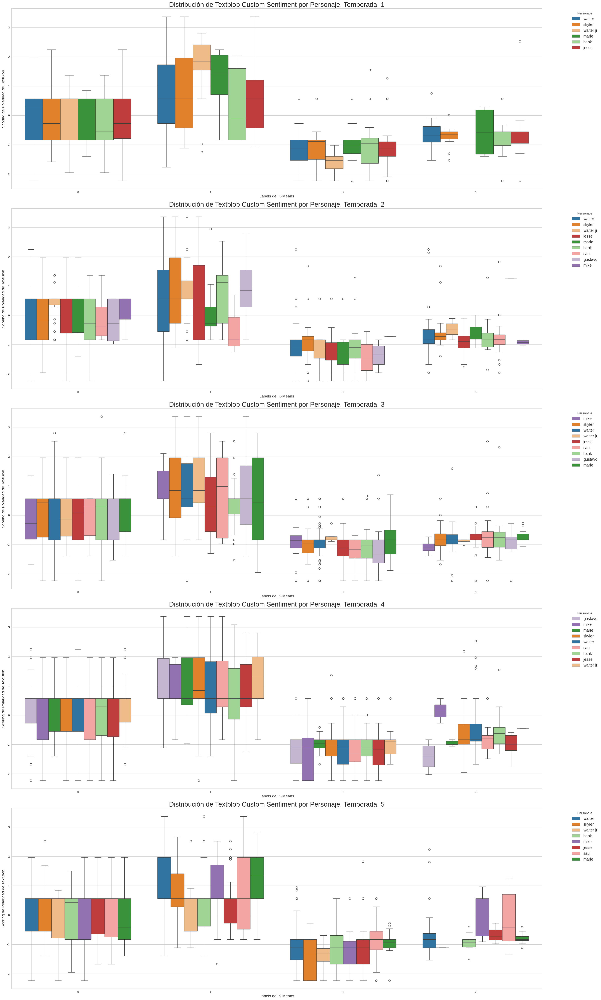

In [ ]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

# Ignore all warnings
warnings.filterwarnings("ignore")

# Get unique values of Temporada
temporadas = X['Temporada'].unique()

# Get unique Personajes and create a color palette
personajes = X['Personaje'].unique()
palette = sns.color_palette("tab20", len(personajes))  # Use a color palette with enough colors for each Personaje
color_dict = dict(zip(personajes, palette))  # Create a mapping of Personaje to color

# Set up the figure for multiple plots
plt.figure(figsize=(30, 10 * len(temporadas)))  # Adjust height based on the number of Temporadas

# Iterate over each Temporada and create a box plot
for i, temporada in enumerate(temporadas):
    plt.subplot(len(temporadas), 1, i + 1)  # Create a subplot for each Temporada

    # Box plot for the current Temporada
    sns.boxplot(
        x='k_means',
        y='textblob_custom_sentiment',
        hue='Personaje',
        data=X[X['Temporada'] == temporada],
        palette=color_dict  # Use the defined color dictionary
    )

    # Adjust title and labels for each subplot
    plt.title(f'Distribución de Textblob Custom Sentiment por Personaje. Temporada  {temporada}', fontsize=24)
    plt.xlabel('Labels del K-Means', fontsize=14)
    plt.ylabel('Scoring de Polaridad de TextBlob Custom', fontsize=14)

    # Adjust the legend for each plot
    plt.legend(title='Personaje', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='large')

# Show the plot
plt.tight_layout()  # Helps with fitting everything in the figure
plt.show()

## Plotting: VADER NEGATIVE

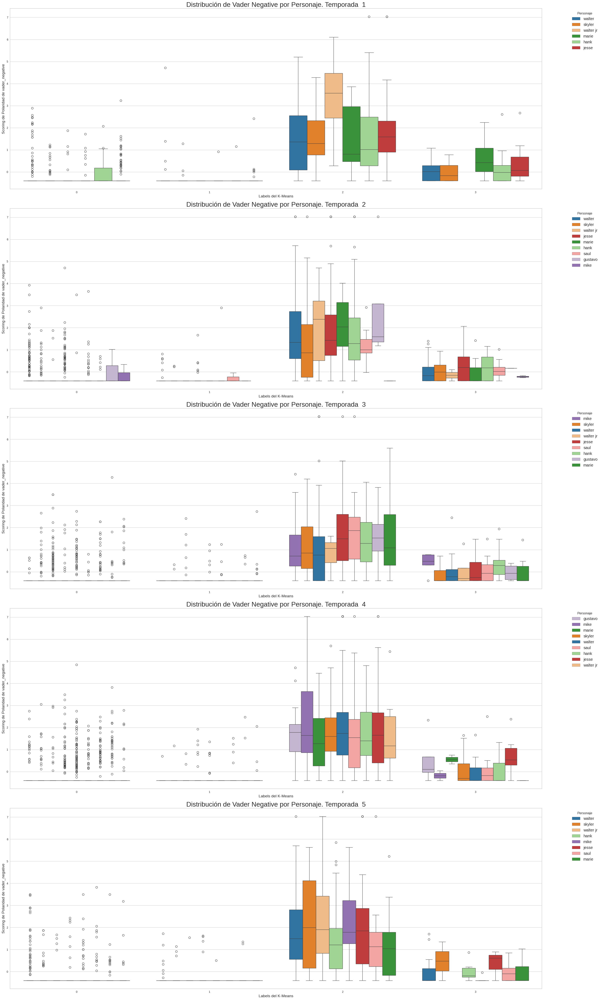

In [ ]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

# Ignore all warnings
warnings.filterwarnings("ignore")

# Get unique values of Temporada
temporadas = X['Temporada'].unique()

# Get unique Personajes and create a color palette
personajes = X['Personaje'].unique()
palette = sns.color_palette("tab20", len(personajes))  # Use a color palette with enough colors for each Personaje
color_dict = dict(zip(personajes, palette))  # Create a mapping of Personaje to color

# Set up the figure for multiple plots
plt.figure(figsize=(30, 10 * len(temporadas)))  # Adjust height based on the number of Temporadas

# Iterate over each Temporada and create a box plot
for i, temporada in enumerate(temporadas):
    plt.subplot(len(temporadas), 1, i + 1)  # Create a subplot for each Temporada

    # Box plot for the current Temporada
    sns.boxplot(
        x='k_means',
        y='vader_negative',
        hue='Personaje',
        data=X[X['Temporada'] == temporada],
        palette=color_dict  # Use the defined color dictionary
    )

    # Adjust title and labels for each subplot
    plt.title(f'Distribución de Vader Negative por Personaje. Temporada  {temporada}', fontsize=24)
    plt.xlabel('Labels del K-Means', fontsize=14)
    plt.ylabel('Scoring de Polaridad de vader_negative', fontsize=14)

    # Adjust the legend for each plot
    plt.legend(title='Personaje', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='large')

# Show the plot
plt.tight_layout()  # Helps with fitting everything in the figure
plt.show()

## Plotting: VADER POSITIVE

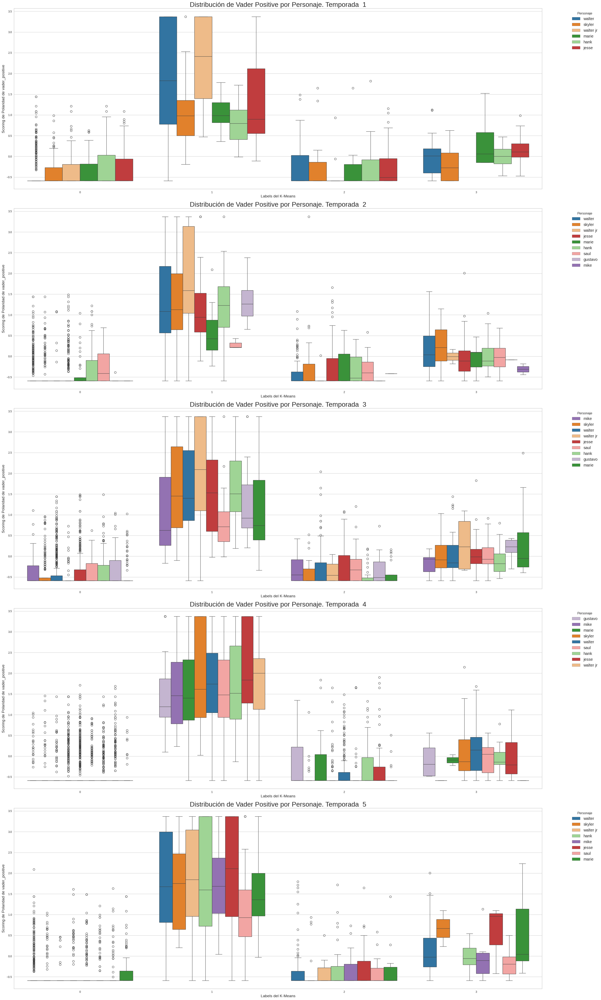

In [ ]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

# Ignore all warnings
warnings.filterwarnings("ignore")

# Get unique values of Temporada
temporadas = X['Temporada'].unique()

# Get unique Personajes and create a color palette
personajes = X['Personaje'].unique()
palette = sns.color_palette("tab20", len(personajes))  # Use a color palette with enough colors for each Personaje
color_dict = dict(zip(personajes, palette))  # Create a mapping of Personaje to color

# Set up the figure for multiple plots
plt.figure(figsize=(30, 10 * len(temporadas)))  # Adjust height based on the number of Temporadas

# Iterate over each Temporada and create a box plot
for i, temporada in enumerate(temporadas):
    plt.subplot(len(temporadas), 1, i + 1)  # Create a subplot for each Temporada

    # Box plot for the current Temporada
    sns.boxplot(
        x='k_means',
        y='vader_positive',
        hue='Personaje',
        data=X[X['Temporada'] == temporada],
        palette=color_dict  # Use the defined color dictionary
    )

    # Adjust title and labels for each subplot
    plt.title(f'Distribución de Vader Positive por Personaje. Temporada  {temporada}', fontsize=24)
    plt.xlabel('Labels del K-Means', fontsize=14)
    plt.ylabel('Scoring de Polaridad de vader_positive', fontsize=14)

    # Adjust the legend for each plot
    plt.legend(title='Personaje', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='large')

# Show the plot
plt.tight_layout()  # Helps with fitting everything in the figure
plt.show()

## Plotting: VADER NEUTRAL

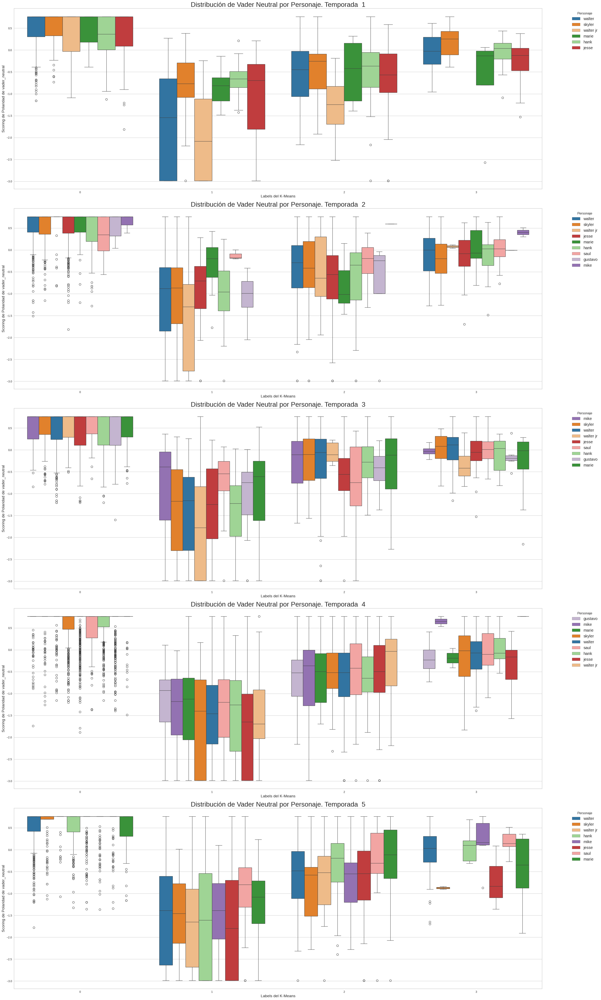

In [ ]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

# Ignore all warnings
warnings.filterwarnings("ignore")

# Get unique values of Temporada
temporadas = X['Temporada'].unique()

# Get unique Personajes and create a color palette
personajes = X['Personaje'].unique()
palette = sns.color_palette("tab20", len(personajes))  # Use a color palette with enough colors for each Personaje
color_dict = dict(zip(personajes, palette))  # Create a mapping of Personaje to color

# Set up the figure for multiple plots
plt.figure(figsize=(30, 10 * len(temporadas)))  # Adjust height based on the number of Temporadas

# Iterate over each Temporada and create a box plot
for i, temporada in enumerate(temporadas):
    plt.subplot(len(temporadas), 1, i + 1)  # Create a subplot for each Temporada

    # Box plot for the current Temporada
    sns.boxplot(
        x='k_means',
        y='vader_neutral',
        hue='Personaje',
        data=X[X['Temporada'] == temporada],
        palette=color_dict  # Use the defined color dictionary
    )

    # Adjust title and labels for each subplot
    plt.title(f'Distribución de Vader Neutral por Personaje. Temporada  {temporada}', fontsize=24)
    plt.xlabel('Labels del K-Means', fontsize=14)
    plt.ylabel('Scoring de Polaridad de vader_neutral', fontsize=14)

    # Adjust the legend for each plot
    plt.legend(title='Personaje', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='large')

# Show the plot
plt.tight_layout()  # Helps with fitting everything in the figure
plt.show()

## Plotting: VADER COMPOUND

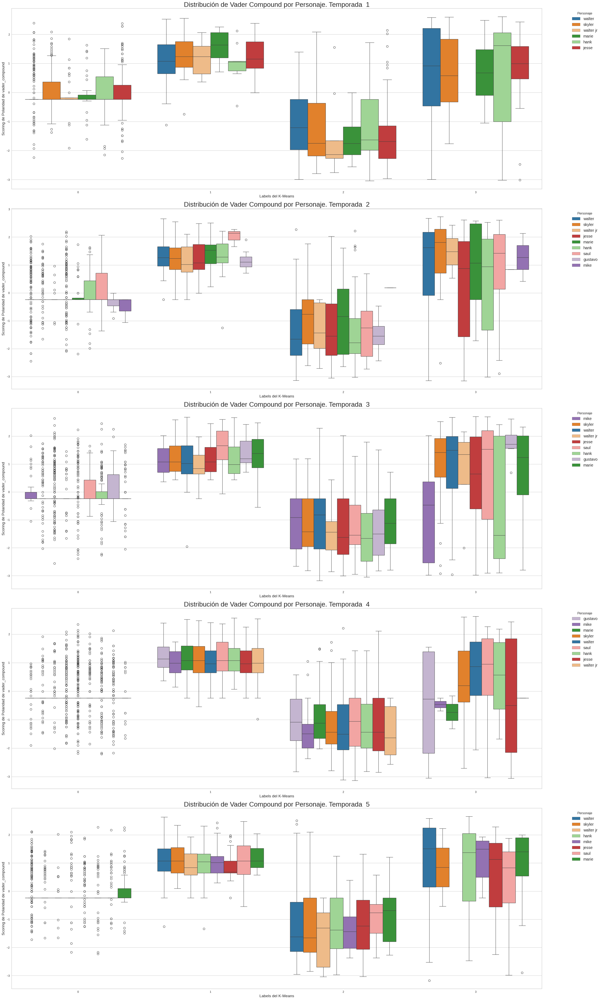

In [ ]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

# Ignore all warnings
warnings.filterwarnings("ignore")

# Get unique values of Temporada
temporadas = X['Temporada'].unique()

# Get unique Personajes and create a color palette
personajes = X['Personaje'].unique()
palette = sns.color_palette("tab20", len(personajes))  # Use a color palette with enough colors for each Personaje
color_dict = dict(zip(personajes, palette))  # Create a mapping of Personaje to color

# Set up the figure for multiple plots
plt.figure(figsize=(30, 10 * len(temporadas)))  # Adjust height based on the number of Temporadas

# Iterate over each Temporada and create a box plot
for i, temporada in enumerate(temporadas):
    plt.subplot(len(temporadas), 1, i + 1)  # Create a subplot for each Temporada

    # Box plot for the current Temporada
    sns.boxplot(
        x='k_means',
        y='vader_compound',
        hue='Personaje',
        data=X[X['Temporada'] == temporada],
        palette=color_dict  # Use the defined color dictionary
    )

    # Adjust title and labels for each subplot
    plt.title(f'Distribución de Vader Compound por Personaje. Temporada  {temporada}', fontsize=24)
    plt.xlabel('Labels del K-Means', fontsize=14)
    plt.ylabel('Scoring de Polaridad de vader_compound', fontsize=14)

    # Adjust the legend for each plot
    plt.legend(title='Personaje', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='large')

# Show the plot
plt.tight_layout()  # Helps with fitting everything in the figure
plt.show()

## Plotting: NRC_emotion_intensity anger

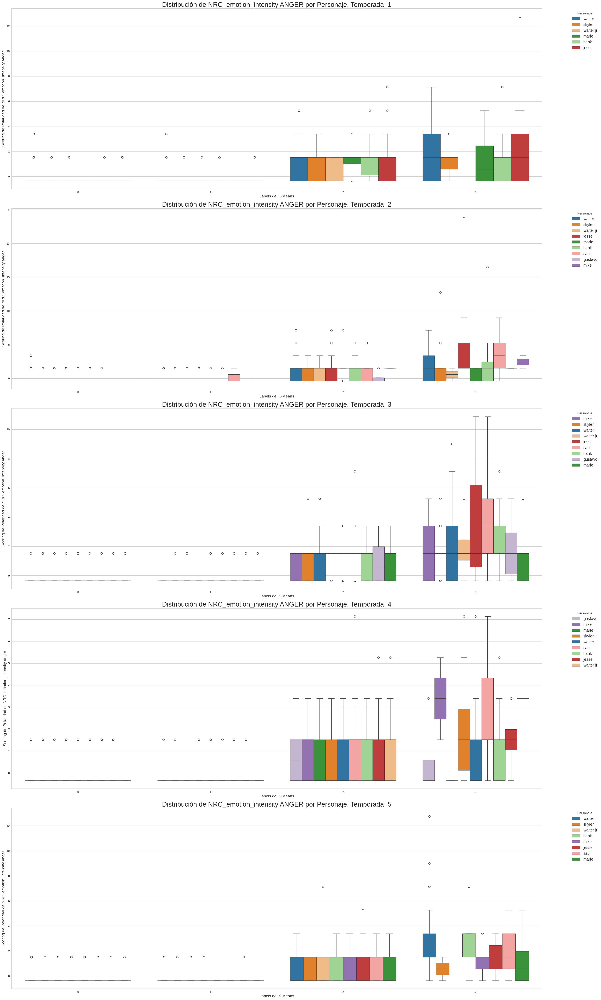

In [ ]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

# Ignore all warnings
warnings.filterwarnings("ignore")

# Get unique values of Temporada
temporadas = X['Temporada'].unique()

# Get unique Personajes and create a color palette
personajes = X['Personaje'].unique()
palette = sns.color_palette("tab20", len(personajes))  # Use a color palette with enough colors for each Personaje
color_dict = dict(zip(personajes, palette))  # Create a mapping of Personaje to color

# Set up the figure for multiple plots
plt.figure(figsize=(30, 10 * len(temporadas)))  # Adjust height based on the number of Temporadas

# Iterate over each Temporada and create a box plot
for i, temporada in enumerate(temporadas):
    plt.subplot(len(temporadas), 1, i + 1)  # Create a subplot for each Temporada

    # Box plot for the current Temporada
    sns.boxplot(
        x='k_means',
        y='NRC_emotion_intensity anger',
        hue='Personaje',
        data=X[X['Temporada'] == temporada],
        palette=color_dict  # Use the defined color dictionary
    )

    # Adjust title and labels for each subplot
    plt.title(f'Distribución de NRC_emotion_intensity ANGER por Personaje. Temporada  {temporada}', fontsize=24)
    plt.xlabel('Labels del K-Means', fontsize=14)
    plt.ylabel('Scoring de Polaridad de NRC_emotion_intensity anger', fontsize=14)

    # Adjust the legend for each plot
    plt.legend(title='Personaje', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='large')

# Show the plot
plt.tight_layout()  # Helps with fitting everything in the figure
plt.show()

## Plotting: NRC_emotion_intensity anticipation

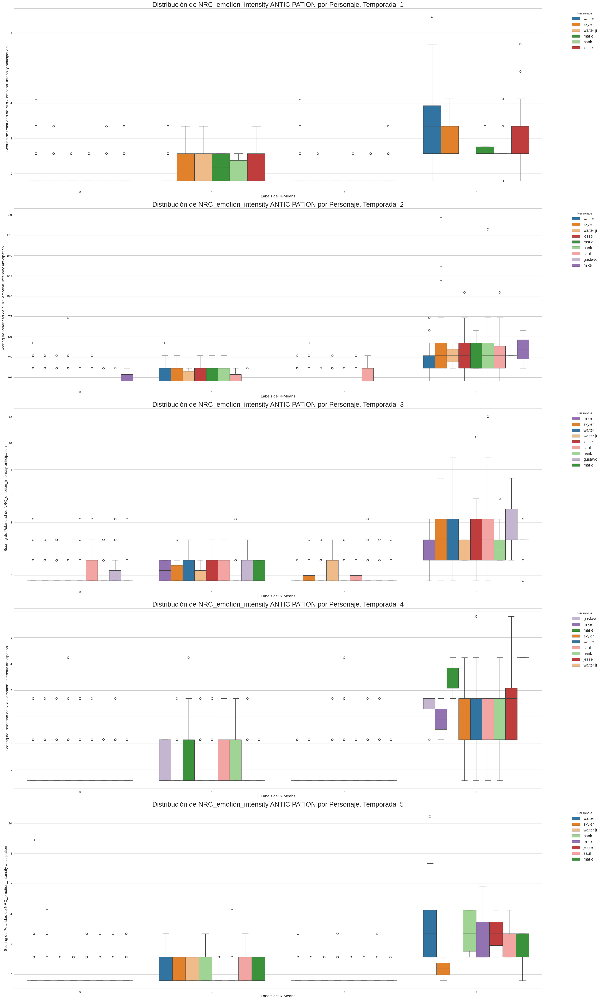

In [ ]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

# Ignore all warnings
warnings.filterwarnings("ignore")

# Get unique values of Temporada
temporadas = X['Temporada'].unique()

# Get unique Personajes and create a color palette
personajes = X['Personaje'].unique()
palette = sns.color_palette("tab20", len(personajes))  # Use a color palette with enough colors for each Personaje
color_dict = dict(zip(personajes, palette))  # Create a mapping of Personaje to color

# Set up the figure for multiple plots
plt.figure(figsize=(30, 10 * len(temporadas)))  # Adjust height based on the number of Temporadas

# Iterate over each Temporada and create a box plot
for i, temporada in enumerate(temporadas):
    plt.subplot(len(temporadas), 1, i + 1)  # Create a subplot for each Temporada

    # Box plot for the current Temporada
    sns.boxplot(
        x='k_means',
        y='NRC_emotion_intensity anticipation',
        hue='Personaje',
        data=X[X['Temporada'] == temporada],
        palette=color_dict  # Use the defined color dictionary
    )

    # Adjust title and labels for each subplot
    plt.title(f'Distribución de NRC_emotion_intensity ANTICIPATION por Personaje. Temporada  {temporada}', fontsize=24)
    plt.xlabel('Labels del K-Means', fontsize=14)
    plt.ylabel('Scoring de Polaridad de NRC_emotion_intensity anticipation', fontsize=14)

    # Adjust the legend for each plot
    plt.legend(title='Personaje', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='large')

# Show the plot
plt.tight_layout()  # Helps with fitting everything in the figure
plt.show()

## Plotting: NRC_emotion_intensity disgust

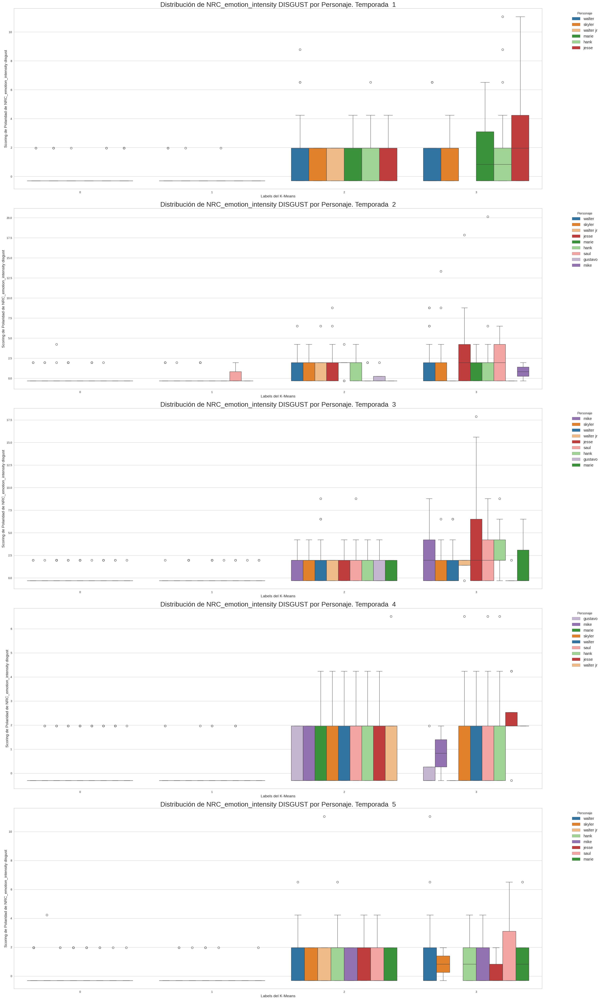

In [ ]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

# Ignore all warnings
warnings.filterwarnings("ignore")

# Get unique values of Temporada
temporadas = X['Temporada'].unique()

# Get unique Personajes and create a color palette
personajes = X['Personaje'].unique()
palette = sns.color_palette("tab20", len(personajes))  # Use a color palette with enough colors for each Personaje
color_dict = dict(zip(personajes, palette))  # Create a mapping of Personaje to color

# Set up the figure for multiple plots
plt.figure(figsize=(30, 10 * len(temporadas)))  # Adjust height based on the number of Temporadas

# Iterate over each Temporada and create a box plot
for i, temporada in enumerate(temporadas):
    plt.subplot(len(temporadas), 1, i + 1)  # Create a subplot for each Temporada

    # Box plot for the current Temporada
    sns.boxplot(
        x='k_means',
        y='NRC_emotion_intensity disgust',
        hue='Personaje',
        data=X[X['Temporada'] == temporada],
        palette=color_dict  # Use the defined color dictionary
    )

    # Adjust title and labels for each subplot
    plt.title(f'Distribución de NRC_emotion_intensity DISGUST por Personaje. Temporada  {temporada}', fontsize=24)
    plt.xlabel('Labels del K-Means', fontsize=14)
    plt.ylabel('Scoring de Polaridad de NRC_emotion_intensity disgust', fontsize=14)

    # Adjust the legend for each plot
    plt.legend(title='Personaje', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='large')

# Show the plot
plt.tight_layout()  # Helps with fitting everything in the figure
plt.show()

## Plotting: NRC_emotion_intensity fear

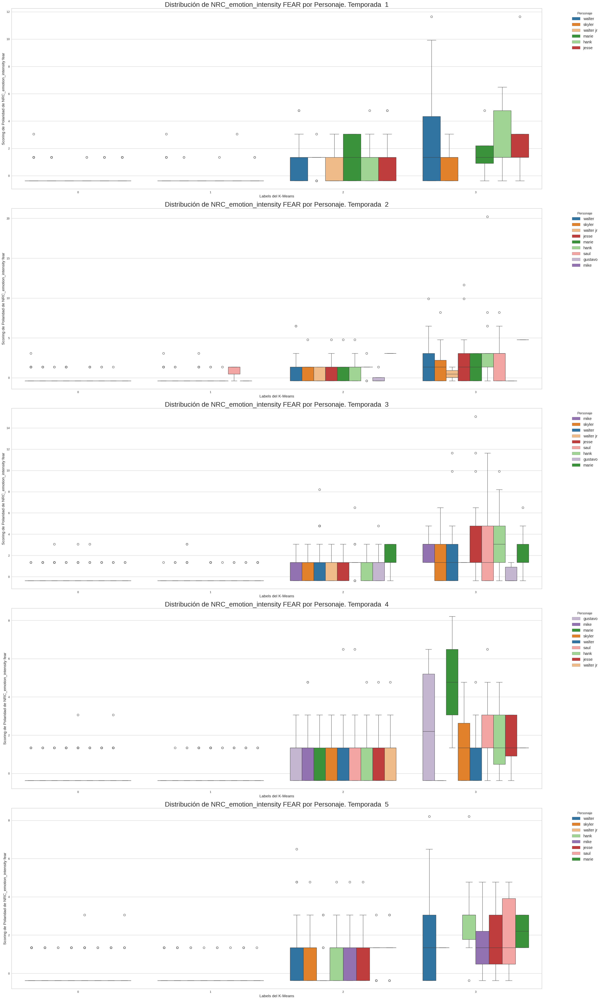

In [ ]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

# Ignore all warnings
warnings.filterwarnings("ignore")

# Get unique values of Temporada
temporadas = X['Temporada'].unique()

# Get unique Personajes and create a color palette
personajes = X['Personaje'].unique()
palette = sns.color_palette("tab20", len(personajes))  # Use a color palette with enough colors for each Personaje
color_dict = dict(zip(personajes, palette))  # Create a mapping of Personaje to color

# Set up the figure for multiple plots
plt.figure(figsize=(30, 10 * len(temporadas)))  # Adjust height based on the number of Temporadas

# Iterate over each Temporada and create a box plot
for i, temporada in enumerate(temporadas):
    plt.subplot(len(temporadas), 1, i + 1)  # Create a subplot for each Temporada

    # Box plot for the current Temporada
    sns.boxplot(
        x='k_means',
        y='NRC_emotion_intensity fear',
        hue='Personaje',
        data=X[X['Temporada'] == temporada],
        palette=color_dict  # Use the defined color dictionary
    )

    # Adjust title and labels for each subplot
    plt.title(f'Distribución de NRC_emotion_intensity FEAR por Personaje. Temporada  {temporada}', fontsize=24)
    plt.xlabel('Labels del K-Means', fontsize=14)
    plt.ylabel('Scoring de Polaridad de NRC_emotion_intensity fear', fontsize=14)

    # Adjust the legend for each plot
    plt.legend(title='Personaje', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='large')

# Show the plot
plt.tight_layout()  # Helps with fitting everything in the figure
plt.show()

## Plotting: NRC_emotion_intensity joy

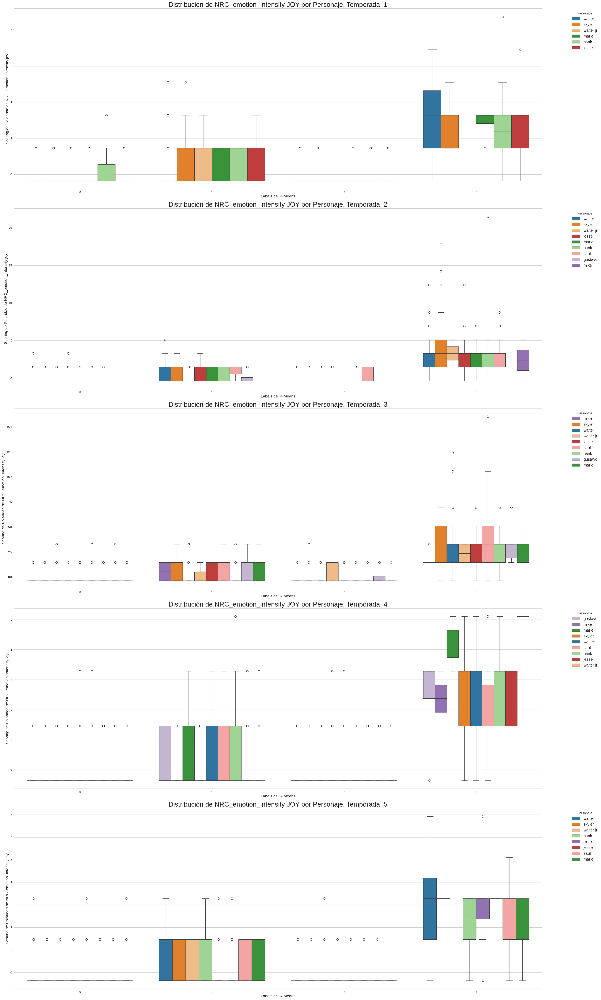

In [ ]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

# Ignore all warnings
warnings.filterwarnings("ignore")

# Get unique values of Temporada
temporadas = X['Temporada'].unique()

# Get unique Personajes and create a color palette
personajes = X['Personaje'].unique()
palette = sns.color_palette("tab20", len(personajes))  # Use a color palette with enough colors for each Personaje
color_dict = dict(zip(personajes, palette))  # Create a mapping of Personaje to color

# Set up the figure for multiple plots
plt.figure(figsize=(30, 10 * len(temporadas)))  # Adjust height based on the number of Temporadas

# Iterate over each Temporada and create a box plot
for i, temporada in enumerate(temporadas):
    plt.subplot(len(temporadas), 1, i + 1)  # Create a subplot for each Temporada

    # Box plot for the current Temporada
    sns.boxplot(
        x='k_means',
        y='NRC_emotion_intensity joy',
        hue='Personaje',
        data=X[X['Temporada'] == temporada],
        palette=color_dict  # Use the defined color dictionary
    )

    # Adjust title and labels for each subplot
    plt.title(f'Distribución de NRC_emotion_intensity JOY por Personaje. Temporada  {temporada}', fontsize=24)
    plt.xlabel('Labels del K-Means', fontsize=14)
    plt.ylabel('Scoring de Polaridad de NRC_emotion_intensity joy', fontsize=14)

    # Adjust the legend for each plot
    plt.legend(title='Personaje', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='large')

# Show the plot
plt.tight_layout()  # Helps with fitting everything in the figure
plt.show()

## Plotting: NRC_emotion_intensity negative

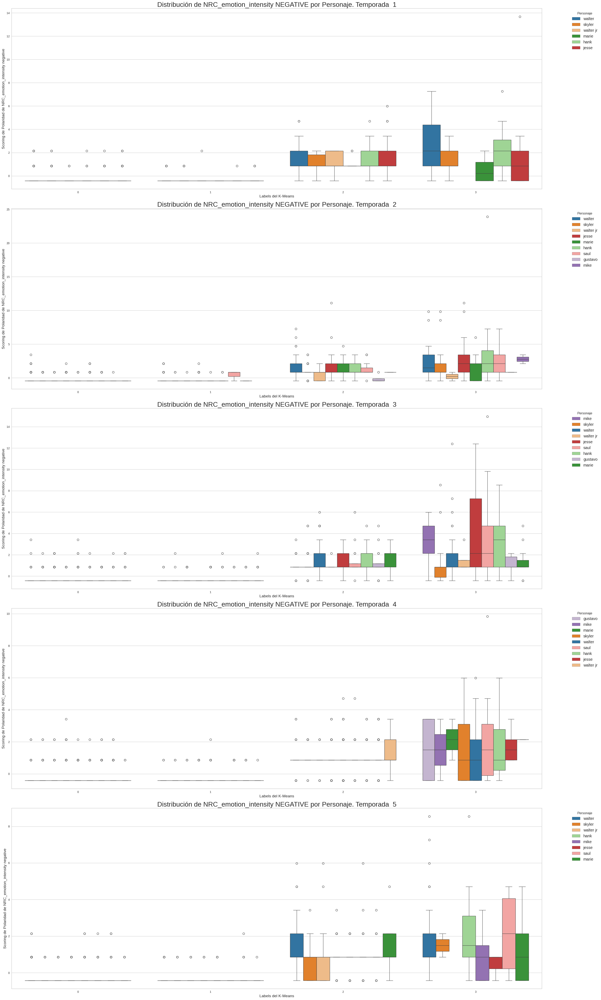

In [ ]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

# Ignore all warnings
warnings.filterwarnings("ignore")

# Get unique values of Temporada
temporadas = X['Temporada'].unique()

# Get unique Personajes and create a color palette
personajes = X['Personaje'].unique()
palette = sns.color_palette("tab20", len(personajes))  # Use a color palette with enough colors for each Personaje
color_dict = dict(zip(personajes, palette))  # Create a mapping of Personaje to color

# Set up the figure for multiple plots
plt.figure(figsize=(30, 10 * len(temporadas)))  # Adjust height based on the number of Temporadas

# Iterate over each Temporada and create a box plot
for i, temporada in enumerate(temporadas):
    plt.subplot(len(temporadas), 1, i + 1)  # Create a subplot for each Temporada

    # Box plot for the current Temporada
    sns.boxplot(
        x='k_means',
        y='NRC_emotion_intensity negative',
        hue='Personaje',
        data=X[X['Temporada'] == temporada],
        palette=color_dict  # Use the defined color dictionary
    )

    # Adjust title and labels for each subplot
    plt.title(f'Distribución de NRC_emotion_intensity NEGATIVE por Personaje. Temporada  {temporada}', fontsize=24)
    plt.xlabel('Labels del K-Means', fontsize=14)
    plt.ylabel('Scoring de Polaridad de NRC_emotion_intensity negative', fontsize=14)

    # Adjust the legend for each plot
    plt.legend(title='Personaje', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='large')

# Show the plot
plt.tight_layout()  # Helps with fitting everything in the figure
plt.show()

## Plotting: NRC_emotion_intensity positive

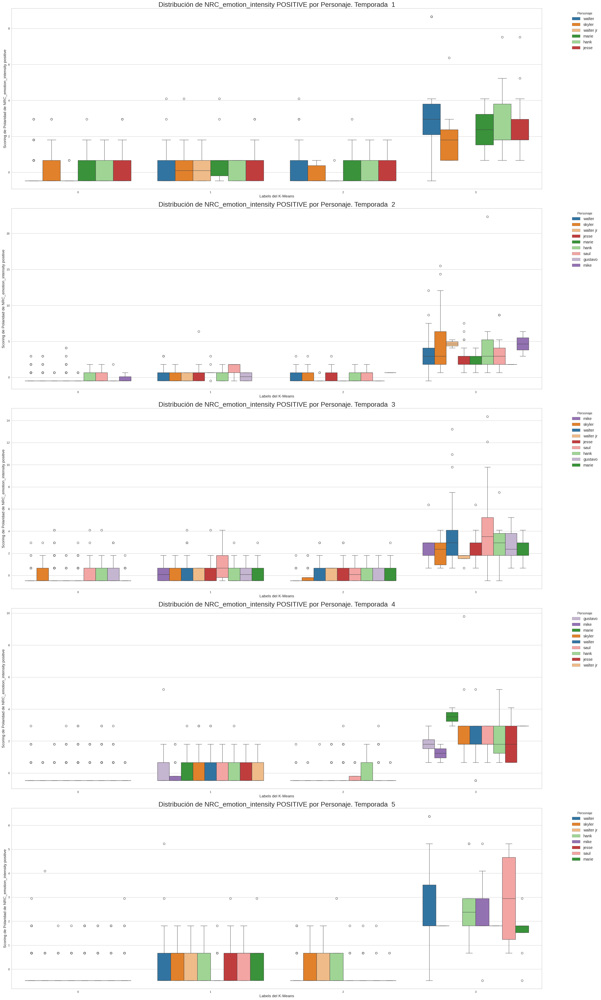

In [ ]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

# Ignore all warnings
warnings.filterwarnings("ignore")

# Get unique values of Temporada
temporadas = X['Temporada'].unique()

# Get unique Personajes and create a color palette
personajes = X['Personaje'].unique()
palette = sns.color_palette("tab20", len(personajes))  # Use a color palette with enough colors for each Personaje
color_dict = dict(zip(personajes, palette))  # Create a mapping of Personaje to color

# Set up the figure for multiple plots
plt.figure(figsize=(30, 10 * len(temporadas)))  # Adjust height based on the number of Temporadas

# Iterate over each Temporada and create a box plot
for i, temporada in enumerate(temporadas):
    plt.subplot(len(temporadas), 1, i + 1)  # Create a subplot for each Temporada

    # Box plot for the current Temporada
    sns.boxplot(
        x='k_means',
        y='NRC_emotion_intensity positive',
        hue='Personaje',
        data=X[X['Temporada'] == temporada],
        palette=color_dict  # Use the defined color dictionary
    )

    # Adjust title and labels for each subplot
    plt.title(f'Distribución de NRC_emotion_intensity POSITIVE por Personaje. Temporada  {temporada}', fontsize=24)
    plt.xlabel('Labels del K-Means', fontsize=14)
    plt.ylabel('Scoring de Polaridad de NRC_emotion_intensity positive', fontsize=14)

    # Adjust the legend for each plot
    plt.legend(title='Personaje', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='large')

# Show the plot
plt.tight_layout()  # Helps with fitting everything in the figure
plt.show()

## Plotting: NRC_emotion_intensity sadness

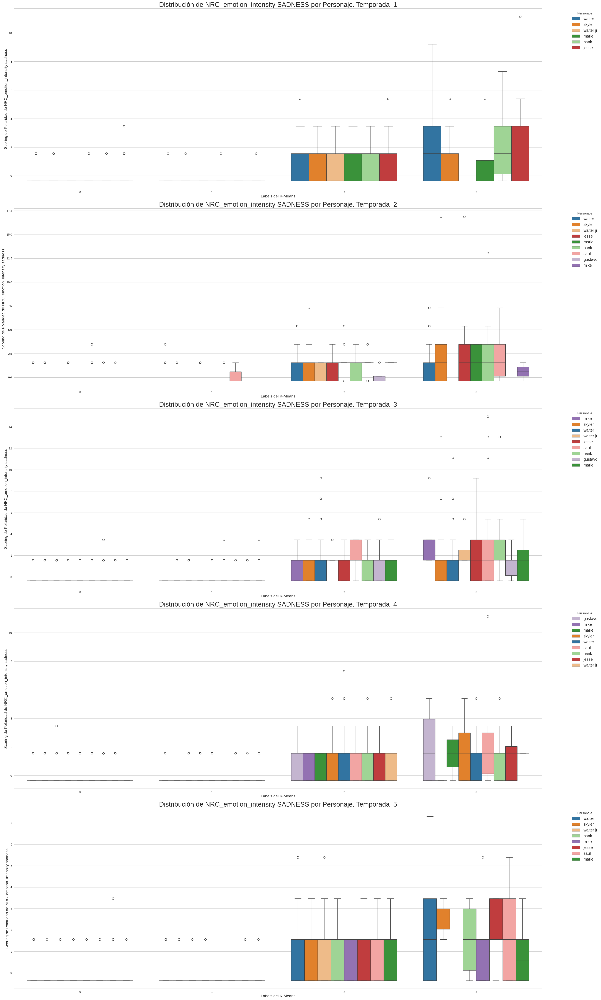

In [ ]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

# Ignore all warnings
warnings.filterwarnings("ignore")

# Get unique values of Temporada
temporadas = X['Temporada'].unique()

# Get unique Personajes and create a color palette
personajes = X['Personaje'].unique()
palette = sns.color_palette("tab20", len(personajes))  # Use a color palette with enough colors for each Personaje
color_dict = dict(zip(personajes, palette))  # Create a mapping of Personaje to color

# Set up the figure for multiple plots
plt.figure(figsize=(30, 10 * len(temporadas)))  # Adjust height based on the number of Temporadas

# Iterate over each Temporada and create a box plot
for i, temporada in enumerate(temporadas):
    plt.subplot(len(temporadas), 1, i + 1)  # Create a subplot for each Temporada

    # Box plot for the current Temporada
    sns.boxplot(
        x='k_means',
        y='NRC_emotion_intensity sadness',
        hue='Personaje',
        data=X[X['Temporada'] == temporada],
        palette=color_dict  # Use the defined color dictionary
    )

    # Adjust title and labels for each subplot
    plt.title(f'Distribución de NRC_emotion_intensity SADNESS por Personaje. Temporada  {temporada}', fontsize=24)
    plt.xlabel('Labels del K-Means', fontsize=14)
    plt.ylabel('Scoring de Polaridad de NRC_emotion_intensity sadness', fontsize=14)

    # Adjust the legend for each plot
    plt.legend(title='Personaje', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='large')

# Show the plot
plt.tight_layout()  # Helps with fitting everything in the figure
plt.show()

## Plotting: NRC_emotion_intensity surprise

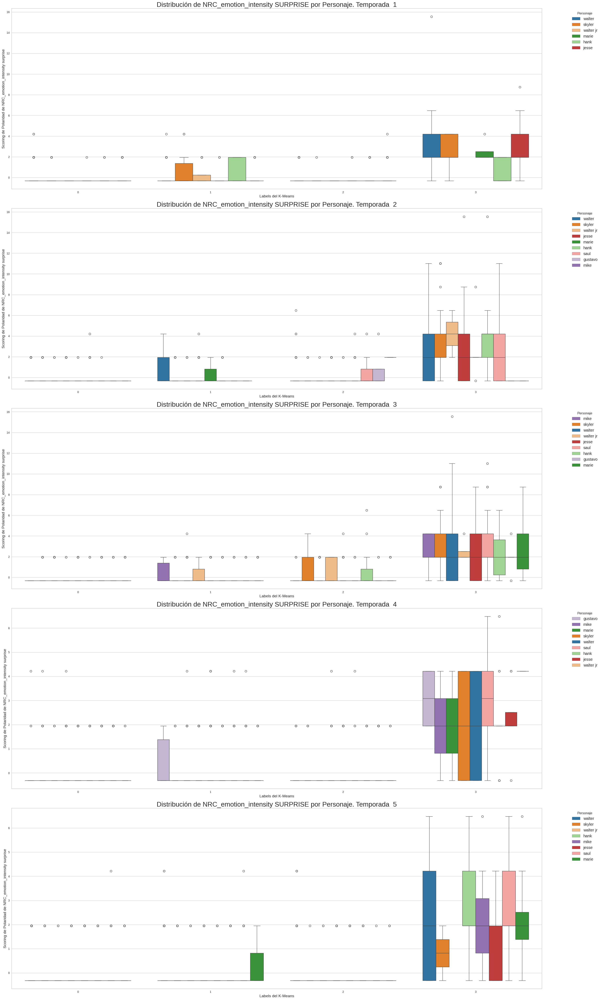

In [ ]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

# Ignore all warnings
warnings.filterwarnings("ignore")

# Get unique values of Temporada
temporadas = X['Temporada'].unique()

# Get unique Personajes and create a color palette
personajes = X['Personaje'].unique()
palette = sns.color_palette("tab20", len(personajes))  # Use a color palette with enough colors for each Personaje
color_dict = dict(zip(personajes, palette))  # Create a mapping of Personaje to color

# Set up the figure for multiple plots
plt.figure(figsize=(30, 10 * len(temporadas)))  # Adjust height based on the number of Temporadas

# Iterate over each Temporada and create a box plot
for i, temporada in enumerate(temporadas):
    plt.subplot(len(temporadas), 1, i + 1)  # Create a subplot for each Temporada

    # Box plot for the current Temporada
    sns.boxplot(
        x='k_means',
        y='NRC_emotion_intensity surprise',
        hue='Personaje',
        data=X[X['Temporada'] == temporada],
        palette=color_dict  # Use the defined color dictionary
    )

    # Adjust title and labels for each subplot
    plt.title(f'Distribución de NRC_emotion_intensity SURPRISE por Personaje. Temporada  {temporada}', fontsize=24)
    plt.xlabel('Labels del K-Means', fontsize=14)
    plt.ylabel('Scoring de Polaridad de NRC_emotion_intensity surprise', fontsize=14)

    # Adjust the legend for each plot
    plt.legend(title='Personaje', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='large')

# Show the plot
plt.tight_layout()  # Helps with fitting everything in the figure
plt.show()

## Plotting: NRC_emotion_intensity trust

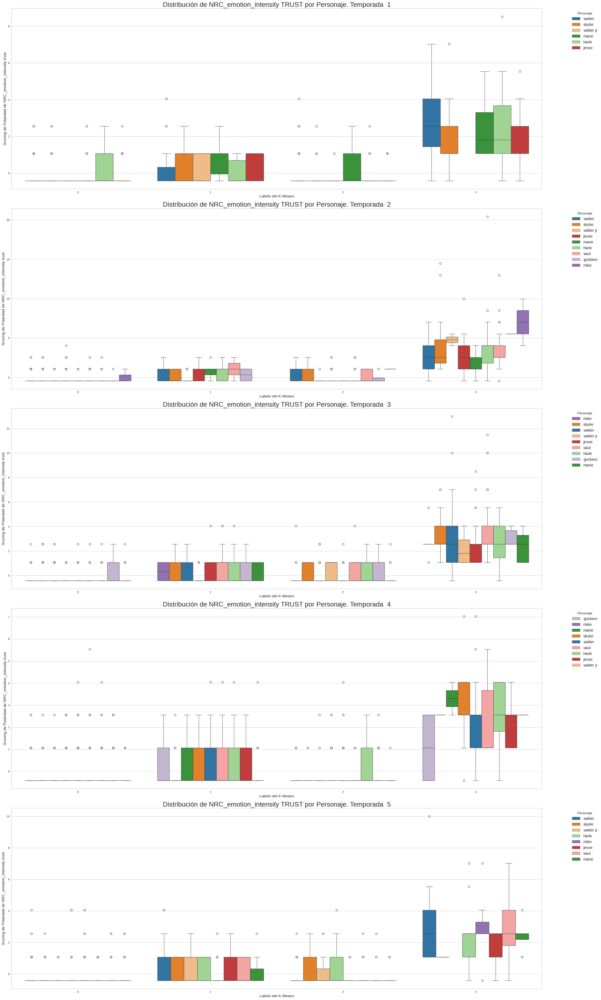

In [ ]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

# Ignore all warnings
warnings.filterwarnings("ignore")

# Get unique values of Temporada
temporadas = X['Temporada'].unique()

# Get unique Personajes and create a color palette
personajes = X['Personaje'].unique()
palette = sns.color_palette("tab20", len(personajes))  # Use a color palette with enough colors for each Personaje
color_dict = dict(zip(personajes, palette))  # Create a mapping of Personaje to color

# Set up the figure for multiple plots
plt.figure(figsize=(30, 10 * len(temporadas)))  # Adjust height based on the number of Temporadas

# Iterate over each Temporada and create a box plot
for i, temporada in enumerate(temporadas):
    plt.subplot(len(temporadas), 1, i + 1)  # Create a subplot for each Temporada

    # Box plot for the current Temporada
    sns.boxplot(
        x='k_means',
        y='NRC_emotion_intensity trust',
        hue='Personaje',
        data=X[X['Temporada'] == temporada],
        palette=color_dict  # Use the defined color dictionary
    )

    # Adjust title and labels for each subplot
    plt.title(f'Distribución de NRC_emotion_intensity TRUST por Personaje. Temporada  {temporada}', fontsize=24)
    plt.xlabel('Labels del K-Means', fontsize=14)
    plt.ylabel('Scoring de Polaridad de NRC_emotion_intensity trust', fontsize=14)

    # Adjust the legend for each plot
    plt.legend(title='Personaje', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='large')

# Show the plot
plt.tight_layout()  # Helps with fitting everything in the figure
plt.show()

## Plotting: RoBERTa_positive

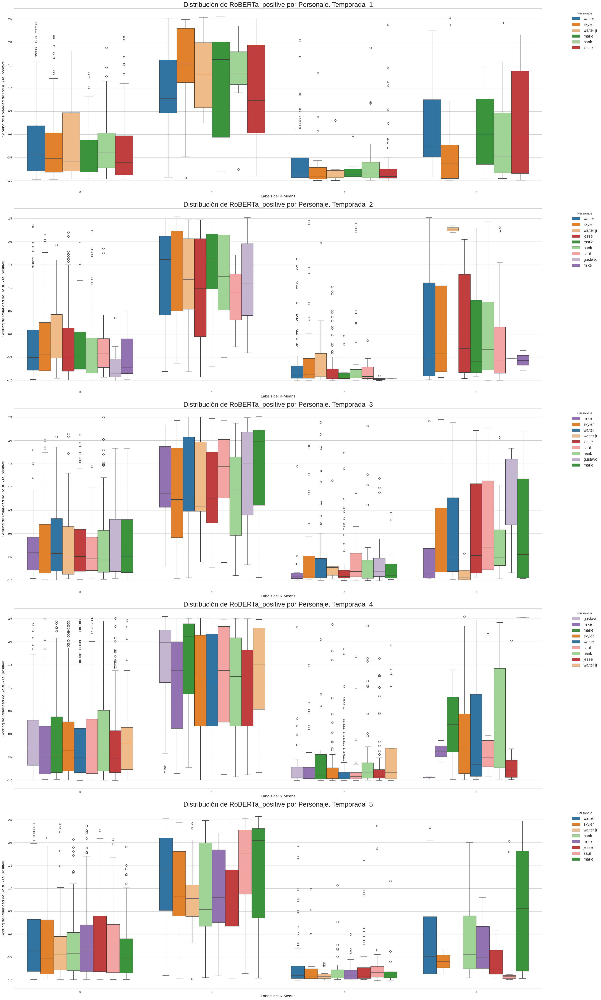

In [ ]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

# Ignore all warnings
warnings.filterwarnings("ignore")

# Get unique values of Temporada
temporadas = X['Temporada'].unique()

# Get unique Personajes and create a color palette
personajes = X['Personaje'].unique()
palette = sns.color_palette("tab20", len(personajes))  # Use a color palette with enough colors for each Personaje
color_dict = dict(zip(personajes, palette))  # Create a mapping of Personaje to color

# Set up the figure for multiple plots
plt.figure(figsize=(30, 10 * len(temporadas)))  # Adjust height based on the number of Temporadas

# Iterate over each Temporada and create a box plot
for i, temporada in enumerate(temporadas):
    plt.subplot(len(temporadas), 1, i + 1)  # Create a subplot for each Temporada

    # Box plot for the current Temporada
    sns.boxplot(
        x='k_means',
        y='RoBERTa_positive',
        hue='Personaje',
        data=X[X['Temporada'] == temporada],
        palette=color_dict  # Use the defined color dictionary
    )

    # Adjust title and labels for each subplot
    plt.title(f'Distribución de RoBERTa_positive por Personaje. Temporada  {temporada}', fontsize=24)
    plt.xlabel('Labels del K-Means', fontsize=14)
    plt.ylabel('Scoring de Polaridad de RoBERTa_positive', fontsize=14)

    # Adjust the legend for each plot
    plt.legend(title='Personaje', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='large')

# Show the plot
plt.tight_layout()  # Helps with fitting everything in the figure
plt.show()

## Plotting: RoBERTa_negative

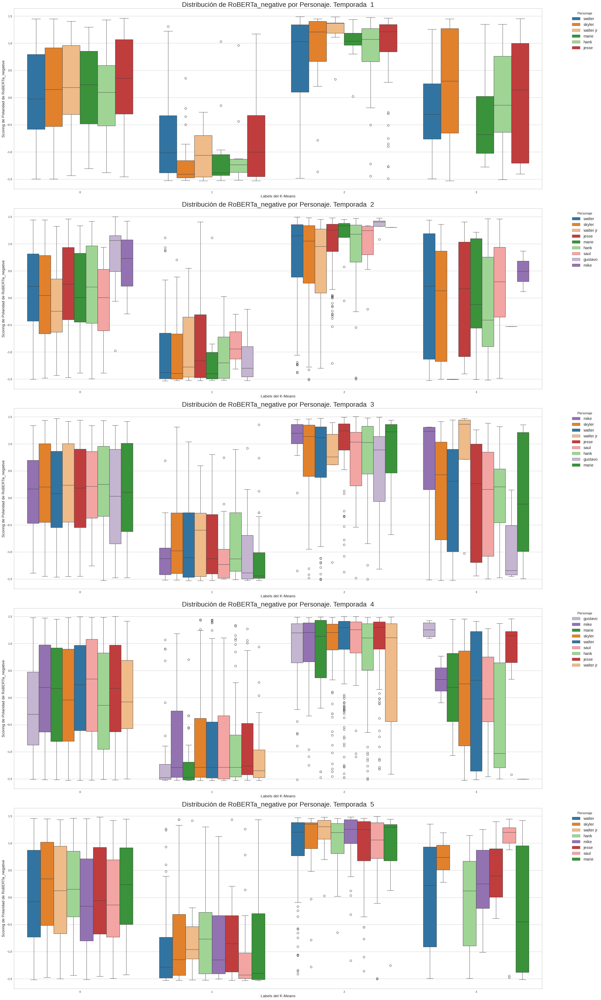

In [ ]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

# Ignore all warnings
warnings.filterwarnings("ignore")

# Get unique values of Temporada
temporadas = X['Temporada'].unique()

# Get unique Personajes and create a color palette
personajes = X['Personaje'].unique()
palette = sns.color_palette("tab20", len(personajes))  # Use a color palette with enough colors for each Personaje
color_dict = dict(zip(personajes, palette))  # Create a mapping of Personaje to color

# Set up the figure for multiple plots
plt.figure(figsize=(30, 10 * len(temporadas)))  # Adjust height based on the number of Temporadas

# Iterate over each Temporada and create a box plot
for i, temporada in enumerate(temporadas):
    plt.subplot(len(temporadas), 1, i + 1)  # Create a subplot for each Temporada

    # Box plot for the current Temporada
    sns.boxplot(
        x='k_means',
        y='RoBERTa_negative',
        hue='Personaje',
        data=X[X['Temporada'] == temporada],
        palette=color_dict  # Use the defined color dictionary
    )

    # Adjust title and labels for each subplot
    plt.title(f'Distribución de RoBERTa_negative por Personaje. Temporada  {temporada}', fontsize=24)
    plt.xlabel('Labels del K-Means', fontsize=14)
    plt.ylabel('Scoring de Polaridad de RoBERTa_negative', fontsize=14)

    # Adjust the legend for each plot
    plt.legend(title='Personaje', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='large')

# Show the plot
plt.tight_layout()  # Helps with fitting everything in the figure
plt.show()

## Plotting: RoBERTa_neutral

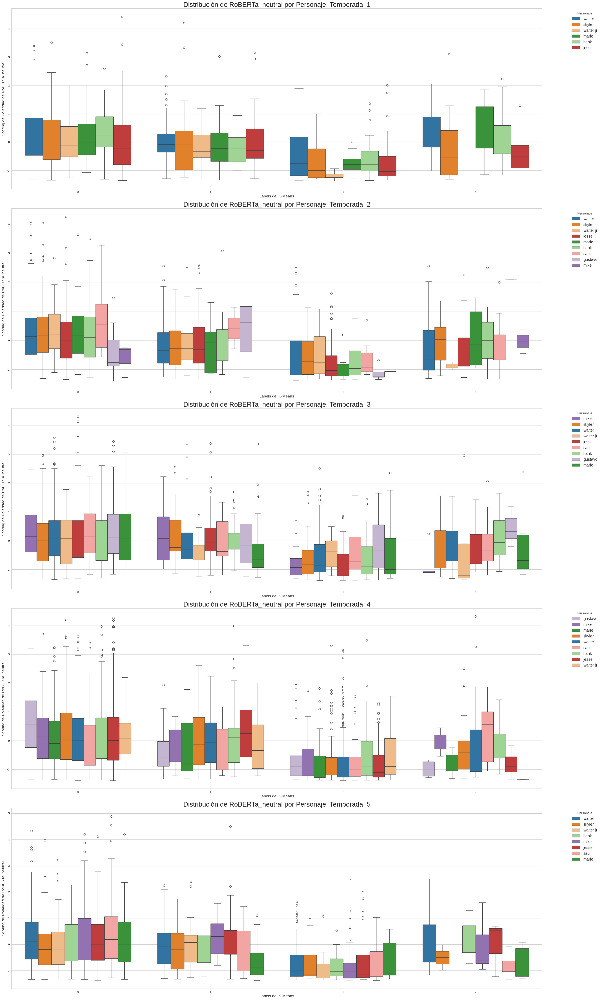

In [ ]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

# Ignore all warnings
warnings.filterwarnings("ignore")

# Get unique values of Temporada
temporadas = X['Temporada'].unique()

# Get unique Personajes and create a color palette
personajes = X['Personaje'].unique()
palette = sns.color_palette("tab20", len(personajes))  # Use a color palette with enough colors for each Personaje
color_dict = dict(zip(personajes, palette))  # Create a mapping of Personaje to color

# Set up the figure for multiple plots
plt.figure(figsize=(30, 10 * len(temporadas)))  # Adjust height based on the number of Temporadas

# Iterate over each Temporada and create a box plot
for i, temporada in enumerate(temporadas):
    plt.subplot(len(temporadas), 1, i + 1)  # Create a subplot for each Temporada

    # Box plot for the current Temporada
    sns.boxplot(
        x='k_means',
        y='RoBERTa_neutral',
        hue='Personaje',
        data=X[X['Temporada'] == temporada],
        palette=color_dict  # Use the defined color dictionary
    )

    # Adjust title and labels for each subplot
    plt.title(f'Distribución de RoBERTa_neutral por Personaje. Temporada  {temporada}', fontsize=24)
    plt.xlabel('Labels del K-Means', fontsize=14)
    plt.ylabel('Scoring de Polaridad de RoBERTa_neutral', fontsize=14)

    # Adjust the legend for each plot
    plt.legend(title='Personaje', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='large')

# Show the plot
plt.tight_layout()  # Helps with fitting everything in the figure
plt.show()

## PRESENCIA DE WALTER POR CLUSTER

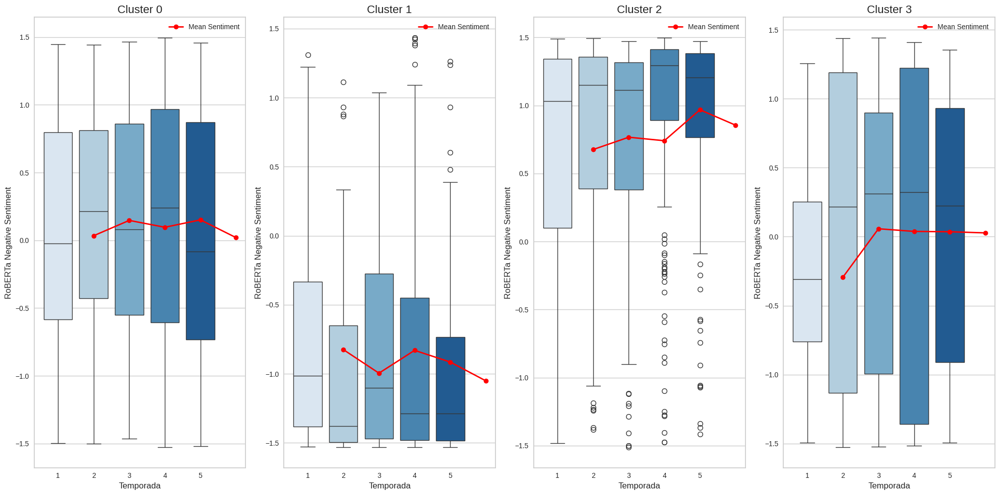

In [ ]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Ignore all warnings
warnings.filterwarnings("ignore")

# Filter data to only include Walter's sentiment values
df_walter = X[X['Personaje'] == 'walter']

# Get unique clusters
clusters = df_walter['k_means'].unique()

# Set up the figure for multiple plots
plt.figure(figsize=(20, 10))  # Width and height of the figure

# Iterate over each cluster and create a box plot for Walter's values per season
for i, cluster in enumerate(sorted(clusters)):
    plt.subplot(1, len(clusters), i + 1)  # Create a subplot for each cluster, side by side

    # Box plot for the current cluster
    sns.boxplot(
        x='Temporada',  # Temporada on the x-axis
        y='RoBERTa_negative',  # Polarity score on the y-axis
        data=df_walter[df_walter['k_means'] == cluster],  # Filter data for the current cluster
        palette='Blues'  # You can customize the color palette
    )

    # Calculate the mean sentiment score per season and plot a trend line
    mean_values = df_walter[df_walter['k_means'] == cluster].groupby('Temporada')['RoBERTa_negative'].mean()
    temporadas = mean_values.index  # Temporada values
    mean_scores = mean_values.values  # Mean sentiment values

    # Plot trend line
    plt.plot(temporadas, mean_scores, color='red', marker='o', linestyle='-', linewidth=2, label='Mean Sentiment')

    # Adjust title and labels for each subplot
    plt.title(f'Cluster {cluster}', fontsize=16)
    plt.xlabel('Temporada', fontsize=12)
    plt.ylabel('RoBERTa Negative Sentiment', fontsize=12)
    plt.legend()

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

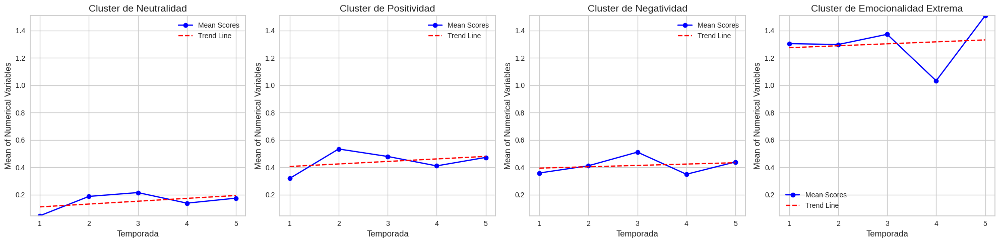

In [72]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression

# Ignore all warnings
warnings.filterwarnings("ignore")

# Filter data to only include Walter's sentiment values
df_walter = X[X['Personaje'] == 'walter']

# Get unique clusters
clusters = df_walter['k_means'].unique()

# Exclude columns that we don't want to plot
excluded_columns = ['Temporada', 'episodio', 'Personaje_id', 'k_means', 'Personaje']

# Identify numerical columns except the excluded ones
numerical_columns = df_walter.select_dtypes(include=np.number).columns
numerical_columns = [col for col in numerical_columns if col not in excluded_columns]

# Set up the figure for multiple plots (one subplot per cluster)
num_clusters = len(clusters)
fig, axes = plt.subplots(1, num_clusters, figsize=(20, 5))  # Create subplots, 1 row, as many columns as clusters

# Ensure axes is always a list (in case there's only one cluster)
if num_clusters == 1:
    axes = [axes]

# Prepare cluster names
cluster_names = {
    0: "Cluster de Neutralidad",
    1: "Cluster de Positividad",
    2: "Cluster de Negatividad",
    3: "Cluster de Emocionalidad Extrema"
}

# Prepare to find global limits for the y-axis
y_min = float('inf')
y_max = float('-inf')

# First pass to determine global y-limits
for cluster in sorted(clusters):
    cluster_data = df_walter[df_walter['k_means'] == cluster]
    mean_values_per_season = cluster_data.groupby('Temporada')[numerical_columns].mean()
    mean_overall = mean_values_per_season.mean(axis=1)
    y_min = min(y_min, mean_overall.min())
    y_max = max(y_max, mean_overall.max())

# Iterate over each cluster to create a plot
for i, cluster in enumerate(sorted(clusters)):
    ax = axes[i]  # Get the subplot corresponding to this cluster

    # Filter data for the current cluster
    cluster_data = df_walter[df_walter['k_means'] == cluster]

    # Calculate the mean of numerical columns for each season
    mean_values_per_season = cluster_data.groupby('Temporada')[numerical_columns].mean()

    # Calculate the overall mean across all numerical columns for each season
    mean_overall = mean_values_per_season.mean(axis=1)

    # Plot the mean values per season
    temporadas = mean_overall.index
    ax.plot(temporadas, mean_overall, marker='o', linestyle='-', color='blue', label='Mean Scores')

    # Add a regression line (linear trend)
    X_season = temporadas.values.reshape(-1, 1)  # Temporadas as X (needs to be 2D for sklearn)
    y_mean = mean_overall.values  # Mean of all variables as Y

    # Fit a linear regression model
    model = LinearRegression()
    model.fit(X_season, y_mean)
    trendline = model.predict(X_season)

    # Plot the regression line
    ax.plot(temporadas, trendline, color='red', linestyle='--', label='Trend Line')

    # Adjust title and labels for each subplot
    ax.set_title(cluster_names.get(cluster, f'Cluster {cluster}'), fontsize=14)
    ax.set_xlabel('Temporada', fontsize=12)
    ax.set_ylabel('Mean of Numerical Variables', fontsize=12)
    ax.legend()

    # Set y-limits to the same for all subplots
    ax.set_ylim(y_min, y_max)

    # Set x-ticks to be integers
    ax.set_xticks(temporadas)  # Set the ticks to the season numbers
    ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: int(x)))  # Format ticks as integers

# Adjust layout and show the plot
plt.tight_layout()
plt.show()